In [3]:
import numpy as np
import matplotlib.pyplot as plt
from kymatio import Scattering2D
import nibabel as nib
import matplotlib.pyplot as plt
import SimpleITK as sitk

In [2]:
import gc

In [5]:
# Load the NIfTI file
month1 = nib.load('anita_1.nii')
month1_data = month1.get_fdata()
month1_data = month1_data/np.max(month1_data)

month3 = nib.load('anita_3.nii')
month3_data = month3.get_fdata()
month3_data = month3_data/np.max(month3_data)

# pad = 16
# pad_data =np.zeros((month1_data.shape[0],month1_data.shape[1],pad))
# month3_data_trimming = month3_data[0:month1_data.shape[0],0:month1_data.shape[1],pad:month1_data.shape[2]]
# month3_data = np.concatenate((month3_data_trimming, pad_data), axis=2)

In [6]:
# Function to convert numpy array to SimpleITK image
def numpy_to_sitk(image_np):
    return sitk.GetImageFromArray(image_np)

# Function to convert SimpleITK image to numpy array
def sitk_to_numpy(image_sitk):
    return sitk.GetArrayFromImage(image_sitk)


In [7]:
month1_sitk = numpy_to_sitk(month1_data)
month3_sitk = numpy_to_sitk(month3_data)

In [8]:
loaded_transform = sitk.ReadTransform("./saved-data/anita/rigid_transform-anita.tfm")
transformed_image_with_loaded_transform = sitk.Resample(month3_sitk, month1_sitk, loaded_transform, sitk.sitkLinear, 0.0, month3_sitk.GetPixelID())
month3_registered = sitk_to_numpy(transformed_image_with_loaded_transform)

In [9]:
index = 200
month1img = month1_data[:,index,:]
month3img = month3_data[:,index,:]
registered_month3img = month3_registered[:,index,:]   

Text(0.5, 1.0, 'Registered Month 3')

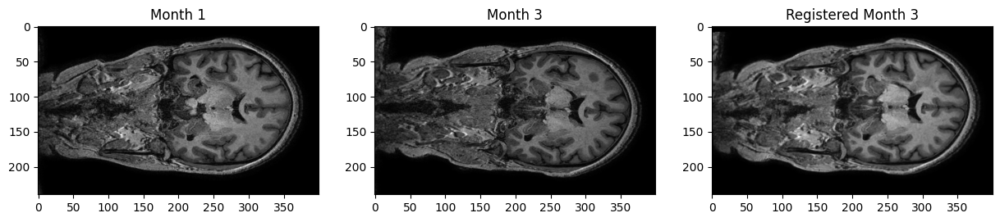

In [10]:
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
# plot slices
ax[0].imshow(month1img, cmap='gray')
ax[0].set_title('Month 1')
ax[1].imshow(month3img, cmap='gray')
ax[1].set_title('Month 3')
ax[2].imshow(registered_month3img, cmap='gray')
ax[2].set_title('Registered Month 3')

In [11]:
# Compute the scattering coefficients
scattering = Scattering2D(J=2, shape=month1img.shape)
scattering_month1 = scattering(month1img)
scattering_month3 = scattering(month3img)
scattering_registered_month3 = scattering(registered_month3img)

In [12]:
# compute correlation between scattering coefficients
normalized_scattering_month1 = scattering_month1/np.max(scattering_month1)
normalized_scattering_month3 = scattering_month3/np.max(scattering_month3)
normalized_scattering_registered_month3 = scattering_registered_month3/np.max(scattering_registered_month3)
threshold = 0.2
# thres

correlation_scatter_old = np.corrcoef(normalized_scattering_month1.flatten(), normalized_scattering_month3.flatten())[0,1]
print('Correlation between month 1 and month 3:', correlation_scatter_old)
correlation_scatter_new = np.corrcoef(normalized_scattering_month1.flatten(), normalized_scattering_registered_month3.flatten())[0,1]
print('Correlation between month 1 and registered month 3:', correlation_scatter_new)

Correlation between month 1 and month 3: 0.9187490536858895
Correlation between month 1 and registered month 3: 0.9506591123745586


In [13]:
# import ndimage
from scipy import ndimage
from scipy.ndimage import gaussian_filter

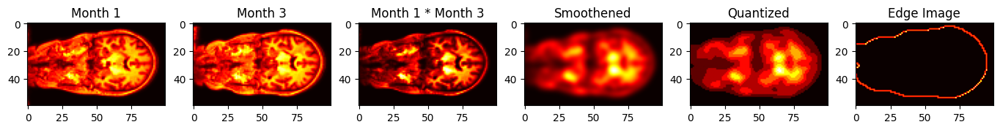

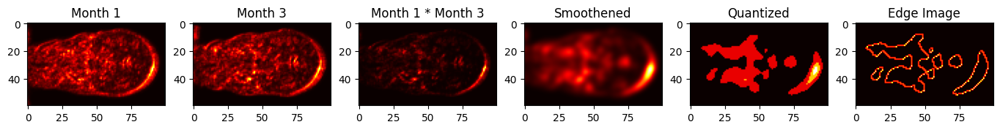

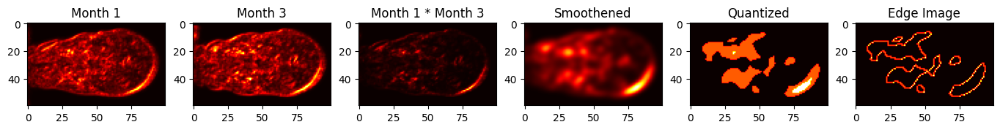

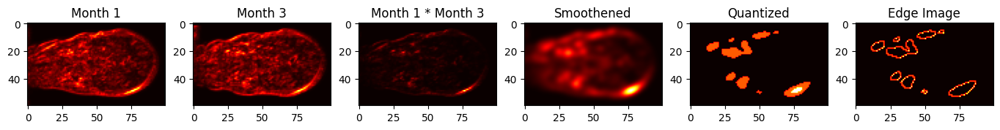

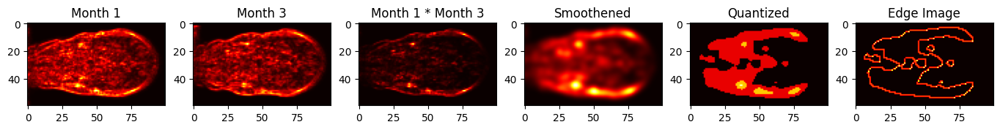

...

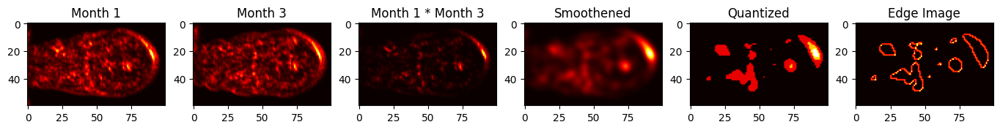

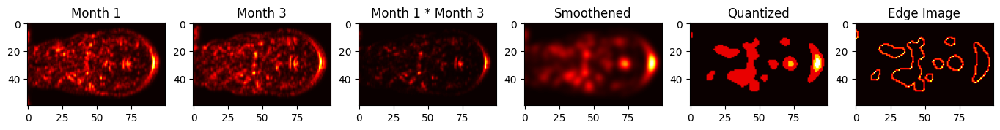

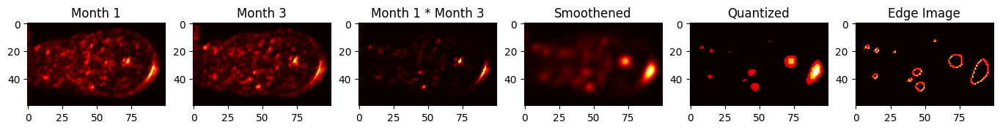

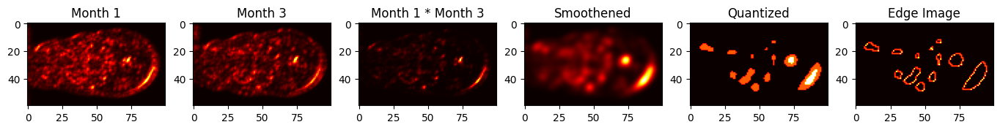

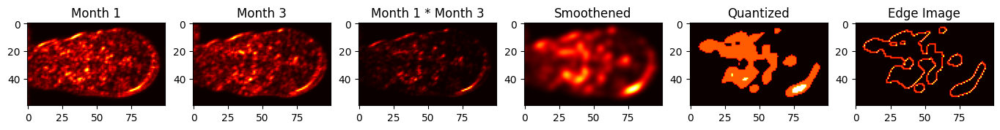

In [14]:

# plot all scattering coefficients
# for i in range(len(scattering_month1)):
for i in range(20):
    fig,ax = plt.subplots(1,6, figsize=(17,5))
    # ax[0].imshow(scattering_month1[i], cmap='hot')
    # ax[0].set_title('Scattering Coefficients Month 1')
    pdt = (scattering_registered_month3[i]*scattering_month1[i]) 
    #pad edge with zeros
    # print(edge.shape)

    ax[0].imshow(scattering_month1[i], cmap='hot')
    ax[0].set_title('Month 1')
    ax[1].imshow(scattering_registered_month3[i], cmap='hot')
    ax[1].set_title('Month 3')
    # ax[2].imshow((scattering_month1[i]-scattering_registered_month3[i]), cmap='gray')
    #overlay scattering month 1 and month 3
    ax[2].imshow(pdt, cmap='hot', alpha=1)
    # ax[2].imshow(scattering_month1[i], cmap='hot', alpha=0.5)
    ax[2].set_title('Month 1 * Month 3')

    #find edge of pdt
    gpdt = gaussian_filter(pdt, sigma=2)
    edge = np.abs(np.diff((pdt)))
    edge = np.concatenate((edge, edge[:,-1].reshape(-1,1)), axis =1)
    gedge = gaussian_filter(edge, sigma=3)
    
    gedge = np.where(gedge > 0.1*np.max(gedge), gedge, 0)
    
    # ax[3].imshow(np.abs(scattering_registered_month3[i]-gedge/np.max(gedge)*np.max(scattering_registered_month3)), cmap='hot')
    # ax[3].imshow(scattering_registered_month3[i]-(1- gedge/np.max(gedge))*np.mean(scattering_registered_month3[i]), cmap='hot')
    # double_edge = np.abs(np.diff(edge))
    # double_edge = np.concatenate((double_edge, double_edge[:,-1].reshape(-1,1)), axis =1)
    # double_edge = np.where(double_edge > 0.15*np.max(double_edge), double_edge, 0)
    
    guassian_pdt = gaussian_filter((10*pdt/np.max(pdt)),sigma=2)
    quantized_pdt = np.round(guassian_pdt)
    boundary1 = np.abs(np.diff(np.sign(quantized_pdt), axis=1))
    boundary1 = np.concatenate((boundary1, boundary1[:,-1].reshape(-1,1)), axis =1)
    boundary2 = np.abs(np.diff(np.sign(quantized_pdt), axis=0))
    boundary2 = np.concatenate((boundary2, boundary2[-1,:].reshape(1,-1)), axis =0)
    boundary = boundary1 + boundary2
    ax[3].imshow(guassian_pdt, cmap='hot')
    ax[3].set_title('Smoothened') 
    ax[4].imshow(quantized_pdt, cmap='hot')
    ax[4].set_title('Quantized')    
    ax[5].imshow(boundary, cmap='hot')
    ax[5].set_title('Edge Image')
    
       
    # ax[4].imshow(np.abs(pdt-gpdt), cmap='hot')
    # ax[4].set_title('Edge Image * Month 1 * Month 3')i
    


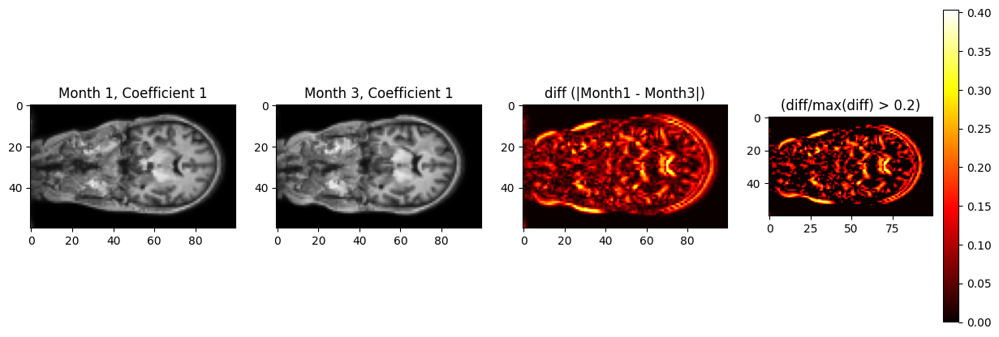

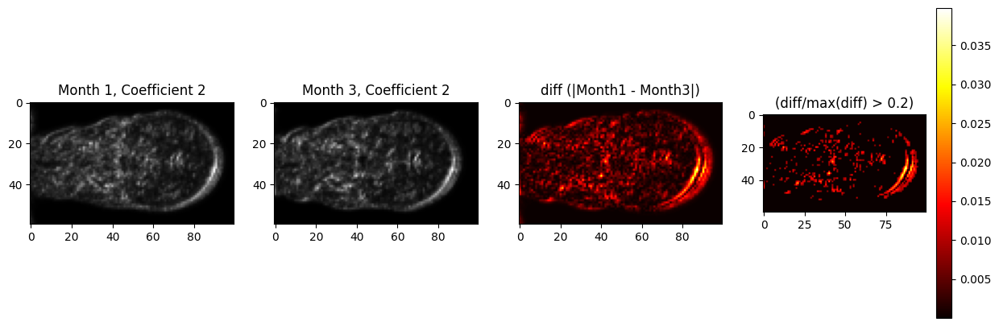

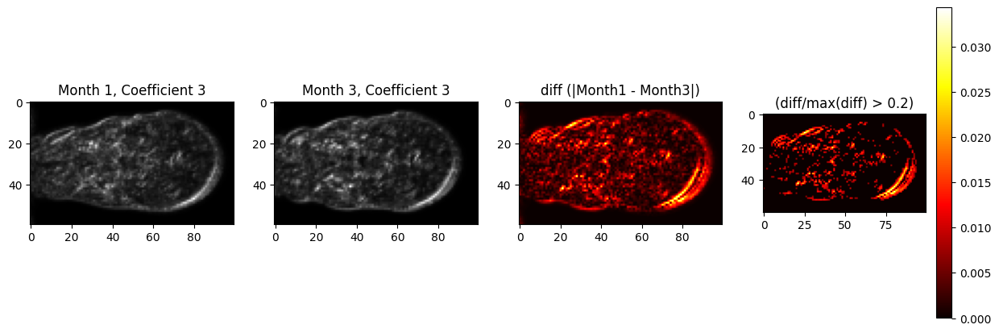

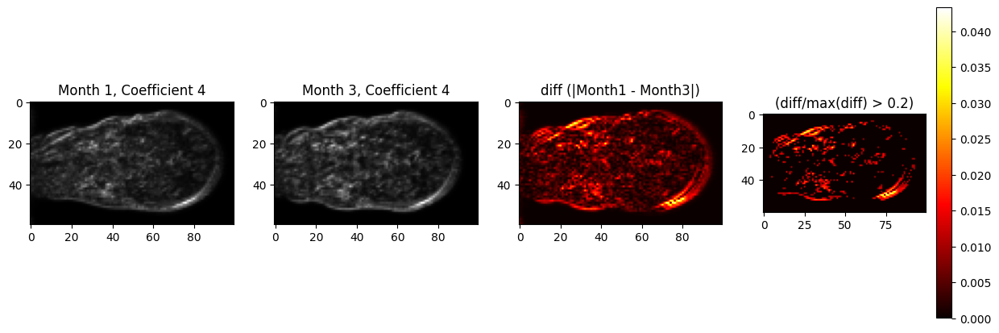

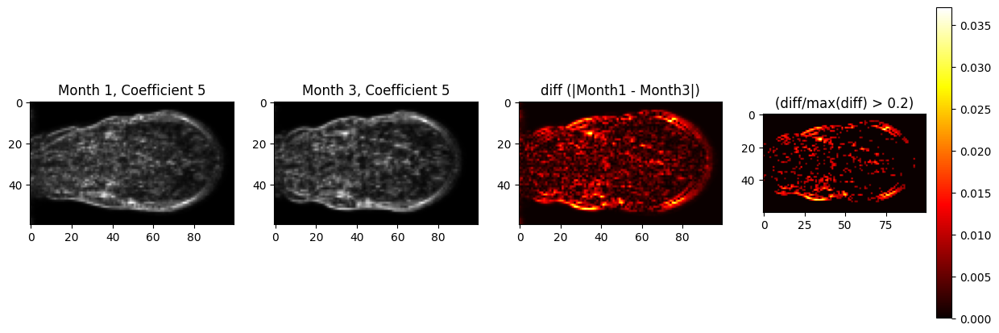

...

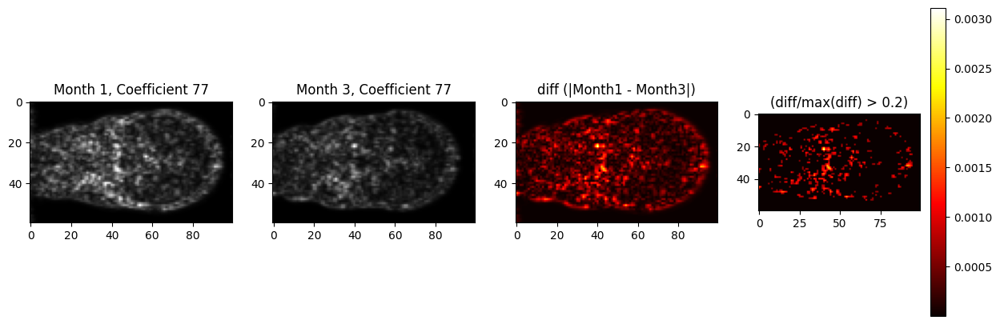

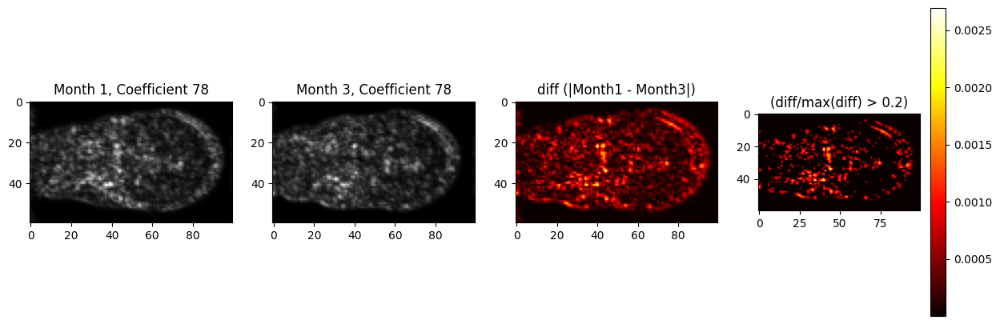

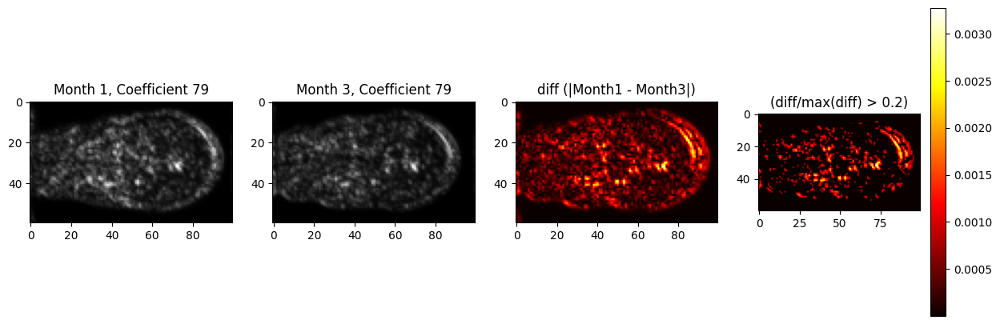

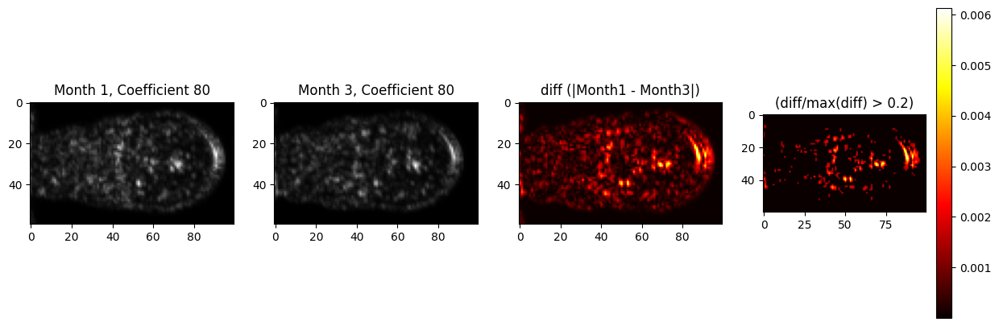

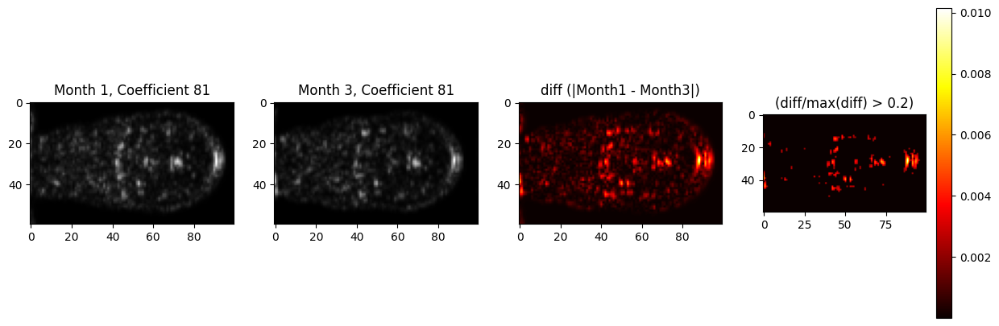

In [13]:
threshold = 0.2
for i in range(scattering_month1.shape[0]):
    fig, ax = plt.subplots(1, 4, figsize=(15, 5))
    
    # Plot for Month 1
    ax[0].imshow(scattering_month1[i, :, :]/np.max(scattering_month1[i,:,:]), cmap='gray')
    ax[0].set_title(f'Month 1, Coefficient {i+1}')
    
    # Plot for Month 3
    ax[1].imshow(scattering_registered_month3[i, :, :]/np.max(scattering_registered_month3[i,:,:]), cmap='gray')
    ax[1].set_title(f'Month 3, Coefficient {i+1}')
    

    # Plot for Difference
    diff = np.abs(scattering_month1[i, :, :] - scattering_registered_month3[i, :, :])
    # diff/= np.max(diff)
    #guassian over diff using library function
    diff = ndimage.gaussian_filter(diff, sigma=0.2)
    
    im = ax[2].imshow(diff, cmap='hot')
    ax[2].set_title(f'diff (|Month1 - Month3|)')
    thresholded_diff = np.where(diff/np.max(diff) > threshold, diff, 0)
    ax[3].imshow(thresholded_diff, cmap='hot')
    ax[3].set_title(f'(diff/max(diff) > {threshold})')
    # Adding colorbar to the difference plot
    fig.colorbar(im, ax=ax[3])

    plt.show()